### **D2APR: Aprendizado de Máquina e Reconhecimento de Padrões** (IFSP, Campinas) <br/>
**Trabalho final - Análise de risco de crédito**

Aluno: Hugo Martinelli Watanuki

Matrícula: 3016692

<a rel="license" href="http://creativecommons.org/licenses/by-nc-sa/4.0/"><img alt="Creative Commons License" style="border-width:0" src="https://i.creativecommons.org/l/by-nc-sa/4.0/88x31.png" /></a><br />This work is licensed under a <a rel="license" href="http://creativecommons.org/licenses/by-nc-sa/4.0/">Creative Commons Attribution-NonCommercial-ShareAlike 4.0 International License</a>. <br/><br/>

In [ ]:
# Imports and default settings for plotting
import numpy as np
import pandas as pd
import hvplot.pandas
import matplotlib.pyplot as plt
import seaborn as sns
import math

from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score
from sklearn.metrics import classification_report

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

sns.set_theme(style="whitegrid")

params = {'legend.fontsize': 'x-large',
          'figure.figsize': (15, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

#**1. Problem description and dataset**

**1.1 Problem statement**

Technological advances in recent decades combined with appropriate statistical techniques have made it possible obtaining non-trivial information and knowledge based on the processing and analysis of massive volumes of data.

Currently, for example, it is possible to combine the massive processing of historical information about individuals' payment habits and, through machine learning solutions, apply statistical and computational techniques to predict with a known degree of confidence whether a given individual has
greater or lesser risk of honoring its financial commitments, a concept comonly referred to as credit risk.

In this sense, it becomes opportune to identify which individual's attributes can help to classify an eventual customer of a credit operation as a good or bad lender before the operation is carried out. This becomes even more important in peer to peer credit operations where the lending platforms, such as Lending Club, have to deal with a very diversified set of lenders with almost no previous credit history. Therefore, as part of the process to achieve this objective, it is necessary not only to identify which attributes will be necessary to support such analysis, as well as identifying the classifier or method of suitable machine learning. As a final product, it is possible to establish a statistical model and a numerical scale (or score) to predict the risk of the credit operation involving individuals of a population.

Currently there are free databases provided by financial institutions that can be used in a first approach to the problem. Secondly, free and Open source software also provides modern tools for optimizing classification models
using massive volumes of data. Together, both elements seem to make work viable that allows potentially contributing to addressing a practical problem in
society.

The objective of this project is, therefore, to identify, through statistical techniques and learning machine, a prediction model based on attributes of individuals that allows measuring the risk of a credit application. The main questions to be answered are:

* What variables can be used to establish credit risk at the moment of a loan request?
* What are the characteristics of the statistical model capable of predicting credit risk?


**1.2 Dataset overview**

The dataset being leveraged in this notebook is available from kaggle: https://www.kaggle.com/datasets/ethon0426/lending-club-20072020q1/

The dataset contains almost 3 Million records where each instance represents a loan request between the years of 2007 and 2020. Each loan request contains 141 atributes and the data dictionary for te dataset can be accessed here:

Due to its considreable size (1.7GB) the dataset cannot be loaded using the regular free google colab platform and therefore it is suggested that this notebook is executed in a computer with sufficient memory (16GB at a minimum).

In [ ]:
# Reading the raw dataset
loan_data = pd.read_csv(r'D:\pythonenv\datasets\Loan_status_2007-2020Q3.csv', low_memory=False, index_col=0)

In [ ]:
# Shape of the raw dataset
loan_data.shape

(2925493, 141)

In [ ]:
# Visualizing the raw dataset
loan_data.head()

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag
0,1077501,5000.0,5000.0,4975.0,36 months,10.65%,162.87,B,B2,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
1,1077430,2500.0,2500.0,2500.0,60 months,15.27%,59.83,C,C4,Ryder,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
2,1077175,2400.0,2400.0,2400.0,36 months,15.96%,84.33,C,C5,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
3,1076863,10000.0,10000.0,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
4,1075358,3000.0,3000.0,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N


In [ ]:
# Attributes of the raw dataset and their types
loan_data.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Index: 2925493 entries, 0 to 105450
Data columns (total 141 columns):
 #    Column                                      Non-Null Count    Dtype  
---   ------                                      --------------    -----  
 0    id                                          2925493 non-null  object 
 1    loan_amnt                                   2925492 non-null  float64
 2    funded_amnt                                 2925492 non-null  float64
 3    funded_amnt_inv                             2925492 non-null  float64
 4    term                                        2925492 non-null  object 
 5    int_rate                                    2925492 non-null  object 
 6    installment                                 2925492 non-null  float64
 7    grade                                       2925492 non-null  object 
 8    sub_grade                                   2925492 non-null  object 
 9    emp_title                                   266140

#**2. Exploratory data analysis**

Although not an usual approach, in this study the size of the raw dataset made impractical to conduct an exploratory data analysis without first performing some cleanup on information that is not useful for the end goal of the project. Therefore, a parallel approach was adopted during the exploratory data analysis: whenever a certain record or attribute was identified as not important for determining the risk of the loan request, the record or attribute was removed from the raw dataset in order to enable the subquesent analysis in the exploratory data analysis pipeline.

**2.1 Distribution of the attributes**

In [ ]:
# When an individual applies for a loan, they can do so independently or together with another person (i.e., a joint application)
loan_data['application_type'].value_counts()


application_type
Individual    2714979
Joint App      210513
Name: count, dtype: int64

In [ ]:
# This study considers only individual applications
loan_data = loan_data[loan_data.application_type == 'Individual']
loan_data.shape




(2714979, 141)

In [ ]:
# Features that are not known at the moment of the loan request need to be removed to not bias the model
#unkw_features = ['application_type', 'annual_inc_joint', 'collection_recovery_fee', 'debt_settlement_flag', 'debt_settlement_flag_date', 'deferral_term', 'hardship_amount', 'hardship_dpd', 'hardship_end_date', 'hardship_flag', 'hardship_last_payment_amount', 'hardship_length', 'hardship_loan_status', 'hardship_payoff_balance_amount', 'hardship_reason', 'hardship_start_date', 'hardship_status', 'hardship_type', 'initial_list_status', 'issue_d', 'last_pymnt_amnt', 'last_pymnt_d', 'last_credit_pull_d', 'next_pymnt_d', 'orig_projected_additional_accrued_interest', 'out_prncp', 'out_prncp_inv', 'payment_plan_start_date', 'pymnt_plan', 'recoveries', 'settlement_amount', 'settlement_date', 'settlement_percentage', 'settlement_status', 'settlement_term', 'total_pymnt', 'total_pymnt_inv', 'total_rec_int', 'total_rec_late_fee', 'total_rec_prncp', 'url']
unkw_features = ['application_type', 'annual_inc_joint', 'collection_recovery_fee', 'debt_settlement_flag', 'deferral_term', 'hardship_amount', 'hardship_dpd', 'hardship_end_date', 'hardship_flag', 'hardship_last_payment_amount', 'hardship_length', 'hardship_loan_status', 'hardship_payoff_balance_amount', 'hardship_reason', 'hardship_start_date', 'hardship_status', 'hardship_type', 'initial_list_status', 'issue_d', 'last_pymnt_amnt', 'last_pymnt_d', 'last_credit_pull_d', 'next_pymnt_d', 'orig_projected_additional_accrued_interest', 'out_prncp', 'out_prncp_inv', 'payment_plan_start_date', 'pymnt_plan', 'recoveries', 'total_pymnt', 'total_pymnt_inv', 'total_rec_int', 'total_rec_late_fee', 'total_rec_prncp', 'url']
loan_data = loan_data.drop(labels=unkw_features, axis=1)
loan_data.shape

(1790838, 106)

In [ ]:
# Loan requests can have different status throught their lifetime
loan_data['loan_status'].value_counts()

loan_status
Fully Paid     1445399
Charged Off     345439
Name: count, dtype: int64

In [ ]:
# Filtering only the loan requests that are known to be succefully paid (i.e., 'Fully Paid') or not (i.e., 'Charged Off')
values_list = loan_data['loan_status'].isin(['Fully Paid','Charged Off'])
loan_data = loan_data[values_list]
loan_data.shape

(1790838, 141)

In [ ]:
# Checking the distribution of classes
df_plot = loan_data.groupby('loan_status').agg(amnt=('loan_status', 'count'))
df_plot = df_plot.reset_index().drop(['loan_status'], axis=1)
df_plot

,amnt
0,345439
1,1445399


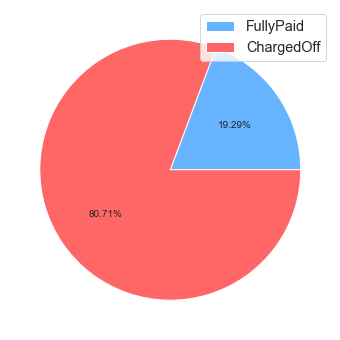

In [ ]:
# Pie chart illustrating the distribution of classes
ax = df_plot.plot.pie(y='amnt', labels=['',''], autopct="%.2f%%", colors=['#66b3ff','#ff6666'], figsize=(6,6))
ax.set_ylabel("")
ax.legend(loc=1, labels=['Fully Paid', 'Charged Off'])
plt.show()

In [ ]:
# Checking the unique data types from the raw dataset
loan_data.dtypes.unique()

array([dtype('O'), dtype('float64')], dtype=object)

In [ ]:
# Checking for duplicated records
loan_data.duplicated().any()

False

In [ ]:
# Checking for missing values
loan_data.isnull().values.any()

True

In [ ]:
# Sorting the features with largest rates of missing values
missing_rate = loan_data.isnull().mean().sort_values(ascending=False)
missing_rate.head(50)

sec_app_collections_12_mths_ex_med    1.000000
sec_app_inq_last_6mths                1.000000
dti_joint                             1.000000
verification_status_joint             1.000000
revol_bal_joint                       1.000000
sec_app_fico_range_low                1.000000
sec_app_earliest_cr_line              1.000000
sec_app_fico_range_high               1.000000
sec_app_mort_acc                      1.000000
sec_app_open_acc                      1.000000
sec_app_revol_util                    1.000000
sec_app_open_act_il                   1.000000
sec_app_num_rev_accts                 1.000000
sec_app_chargeoff_within_12_mths      1.000000
mths_since_last_record                0.833848
mths_since_recent_bc_dlq              0.764538
mths_since_last_major_derog           0.737178
mths_since_recent_revol_delinq        0.666603
il_util                               0.545422
mths_since_last_delinq                0.506619
mths_since_rcnt_il                    0.487441
all_util     

In [ ]:
# Removing features whit missing rates above 40% as they can generate excessive bias
empty_features = list(missing_rate[missing_rate > 0.4].index)
loan_data = loan_data.drop(labels=empty_features, axis=1)
loan_data.shape

(1790838, 73)

In [ ]:
# Descriptive statistics of each feature
loan_data.describe(include='all')

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,1790838,1.790838e+06,1.790838e+06,1.790838e+06,1790838,1790838,1.790838e+06,1790838,1790838,1670451,...,1.723311e+06,1.723311e+06,1.723157e+06,1.724429e+06,1.790141e+06,1.790799e+06,1.723311e+06,1.743557e+06,1.743557e+06,1.723311e+06
unique,1790838,NaN,NaN,NaN,2,684,NaN,7,35,447061,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,1077501,NaN,NaN,NaN,36 months,10.99%,NaN,B,C1,Teacher,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,1348640,42527,NaN,528378,114564,28565,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,1.441314e+04,1.440681e+04,1.438882e+04,NaN,NaN,4.353855e+02,NaN,NaN,NaN,...,8.698604e-02,2.157478e+00,9.411276e+01,4.317866e+01,1.324331e-01,5.074271e-02,1.753194e+05,5.024283e+04,2.252733e+04,4.286059e+04
std,NaN,8.857076e+03,8.854164e+03,8.855533e+03,NaN,NaN,2.635809e+02,NaN,NaN,NaN,...,5.037248e-01,1.855025e+00,8.919241e+00,3.613710e+01,3.731626e-01,3.968249e-01,1.798984e+05,4.893710e+04,2.248526e+04,4.418467e+04
min,NaN,5.000000e+02,5.000000e+02,0.000000e+00,NaN,NaN,4.930000e+00,NaN,NaN,NaN,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,NaN,7.675000e+03,7.675000e+03,7.600000e+03,NaN,NaN,2.447000e+02,NaN,NaN,NaN,...,0.000000e+00,1.000000e+00,9.130000e+01,0.000000e+00,0.000000e+00,0.000000e+00,4.990000e+04,2.078700e+04,8.000000e+03,1.494200e+04
50%,NaN,1.200000e+04,1.200000e+04,1.200000e+04,NaN,NaN,3.704800e+02,NaN,NaN,NaN,...,0.000000e+00,2.000000e+00,9.820000e+01,4.000000e+01,0.000000e+00,0.000000e+00,1.117000e+05,3.740800e+04,1.570000e+04,3.210000e+04
75%,NaN,2.000000e+04,2.000000e+04,2.000000e+04,NaN,NaN,5.768900e+02,NaN,NaN,NaN,...,0.000000e+00,3.000000e+00,1.000000e+02,7.500000e+01,0.000000e+00,0.000000e+00,2.530000e+05,6.320400e+04,2.940000e+04,5.750900e+04


In [ ]:
# Listing the non numeric features
df_datatypes = pd.DataFrame(loan_data.dtypes, columns=['data_type'])
df_object = df_datatypes[df_datatypes['data_type'] == 'object']
df_object

,data_type
id,object
term,object
int_rate,object
grade,object
sub_grade,object
emp_title,object
emp_length,object
home_ownership,object
verification_status,object
loan_status,object


In [ ]:
# Number of non numeric features
len(df_object)

In [ ]:
# Showing the unique values of each non numeric feature
for atribute in list(df_object.index.values):
    print(f'{atribute} ==> {loan_data[atribute].unique()}')

id ==> ['1077501' '1077430' '1077175' ... '102628603' '102196576' '99799684']
term ==> [' 36 months' ' 60 months']
int_rate ==> [' 10.65%' ' 15.27%' ' 15.96%' ' 13.49%' ' 12.69%' '  7.90%' ' 18.64%'
 ' 21.28%' ' 14.65%' '  9.91%' ' 16.29%' '  6.03%' ' 11.71%' ' 12.42%'
 ' 14.27%' ' 16.77%' '  7.51%' '  8.90%' ' 18.25%' '  6.62%' ' 19.91%'
 ' 17.27%' ' 17.58%' ' 21.67%' ' 19.42%' ' 22.06%' ' 20.89%' ' 20.30%'
 ' 23.91%' ' 19.03%' ' 23.52%' ' 23.13%' ' 22.74%' ' 22.35%' ' 24.11%'
 '  6.00%' ' 22.11%' '  7.49%' ' 11.99%' '  5.99%' ' 10.99%' '  9.99%'
 ' 18.79%' ' 11.49%' '  8.49%' ' 15.99%' ' 16.49%' '  6.99%' ' 12.99%'
 ' 15.23%' ' 14.79%' '  5.42%' ' 10.59%' ' 17.49%' ' 15.62%' ' 21.36%'
 ' 19.29%' ' 13.99%' ' 18.39%' ' 16.89%' ' 17.99%' ' 20.62%' ' 20.99%'
 ' 22.85%' ' 19.69%' ' 20.25%' ' 23.22%' ' 21.74%' ' 22.48%' ' 23.59%'
 ' 12.62%' ' 18.07%' ' 11.63%' '  7.91%' '  7.42%' ' 11.14%' ' 20.20%'
 ' 12.12%' ' 19.39%' ' 16.11%' ' 17.54%' ' 22.64%' ' 13.84%' ' 16.59%'
 ' 17.19%' ' 12.87%'

earliest_cr_line ==> ['Jan-1985' 'Apr-1999' 'Nov-2001' 'Feb-1996' 'Jan-1996' 'Nov-2004'
 'Jul-2005' 'Jan-2007' 'Apr-2004' 'Sep-2004' 'Jan-1998' 'Oct-1989'
 'Jul-2003' 'May-1991' 'Sep-2007' 'Oct-1998' 'Aug-1993' 'Oct-2003'
 'Jan-2001' 'Nov-1997' 'Feb-1983' 'Jul-1985' 'Apr-2003' 'Jun-2001'
 'Feb-2002' 'Aug-1984' 'Nov-2006' 'Dec-1987' 'Nov-1981' 'Feb-1997'
 'Apr-2005' 'Oct-2007' 'Dec-2000' 'Apr-2007' 'Dec-2001' 'Jan-2003'
 'Mar-1994' 'Sep-1998' 'Jun-2004' 'Nov-1995' 'Jul-1999' 'Jun-1995'
 'Sep-1992' 'Jan-2002' 'Apr-1992' 'Oct-2006' 'May-2000' 'Dec-1998'
 'Dec-2004' 'Oct-2000' 'May-2002' 'May-2006' 'Jul-2002' 'Jul-2006'
 'May-1997' 'Oct-2005' 'Apr-1995' 'Oct-2002' 'Jan-2000' 'Apr-2000'
 'Dec-1994' 'Sep-2005' 'Dec-1984' 'Dec-1999' 'Nov-2003' 'Jun-1989'
 'Jun-2003' 'Oct-1996' 'May-2003' 'Jun-2002' 'Jun-2007' 'Dec-1996'
 'Feb-1984' 'Sep-2002' 'Jan-1986' 'May-1998' 'Jan-1997' 'Jun-2005'
 'Feb-1990' 'Mar-2004' 'Jul-1995' 'Aug-1994' 'Jun-1992' 'Mar-1997'
 'Apr-2006' 'Apr-1990' 'Aug-1999' 'Sep-20

In [ ]:
# Listing the numeric features
df_numeric = loan_data.select_dtypes(include= np.number)
df_numeric = list(df_numeric.columns.values)
df_numeric


['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'installment',
 'annual_inc',
 'dti',
 'delinq_2yrs',
 'fico_range_low',
 'fico_range_high',
 'inq_last_6mths',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'total_acc',
 'last_fico_range_high',
 'last_fico_range_low',
 'collections_12_mths_ex_med',
 'policy_code',
 'acc_now_delinq',
 'tot_coll_amt',
 'tot_cur_bal',
 'total_rev_hi_lim',
 'acc_open_past_24mths',
 'avg_cur_bal',
 'bc_open_to_buy',
 'bc_util',
 'chargeoff_within_12_mths',
 'delinq_amnt',
 'mo_sin_old_il_acct',
 'mo_sin_old_rev_tl_op',
 'mo_sin_rcnt_rev_tl_op',
 'mo_sin_rcnt_tl',
 'mort_acc',
 'mths_since_recent_bc',
 'mths_since_recent_inq',
 'num_accts_ever_120_pd',
 'num_actv_bc_tl',
 'num_actv_rev_tl',
 'num_bc_sats',
 'num_bc_tl',
 'num_il_tl',
 'num_op_rev_tl',
 'num_rev_accts',
 'num_rev_tl_bal_gt_0',
 'num_sats',
 'num_tl_120dpd_2m',
 'num_tl_30dpd',
 'num_tl_90g_dpd_24m',
 'num_tl_op_past_12m',
 'pct_tl_nvr_dlq',
 'percent_bc_gt_75',
 'pub_rec_bankruptcies',
 'tax_lien

In [ ]:
# Number of numeric features
len(df_numeric)

57

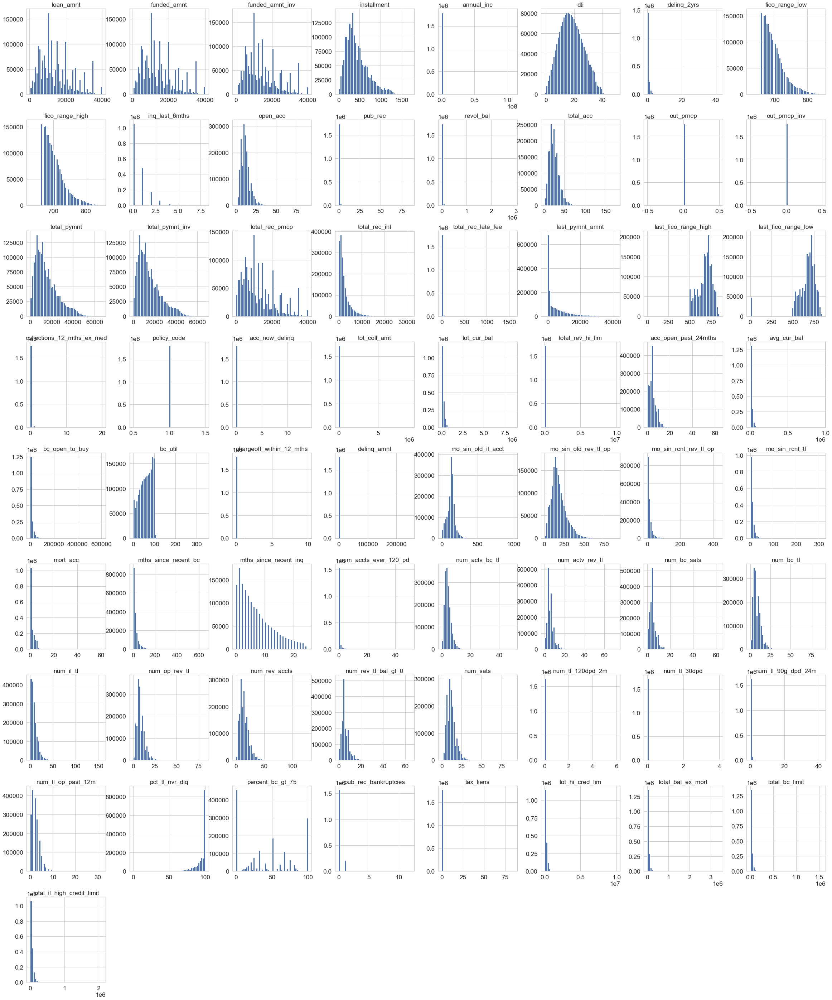

In [ ]:
# Plotting an histogram for each numeric feature
loan_data.hist(bins=50, figsize=(40,50))
display()  # just to avoid texts in the notebook output

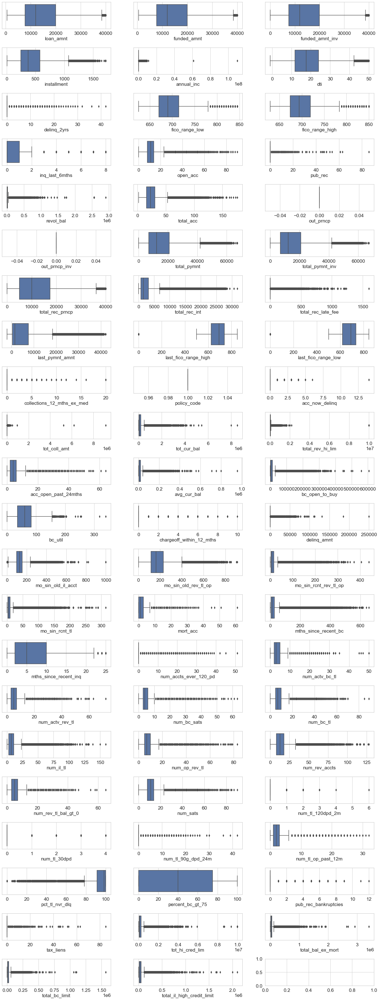

In [ ]:
# Plotting the box plots for the numeric features
fig, axes = plt.subplots(20, 3, figsize=(20, 50))
fig.tight_layout(pad=3.0)

for i, attr in enumerate(df_numeric):
    row = i // 3
    col = i % 3
    sns.boxplot(data=loan_data, x=attr, ax=axes[row, col])

**2.2 Correlation among numeric attributes**

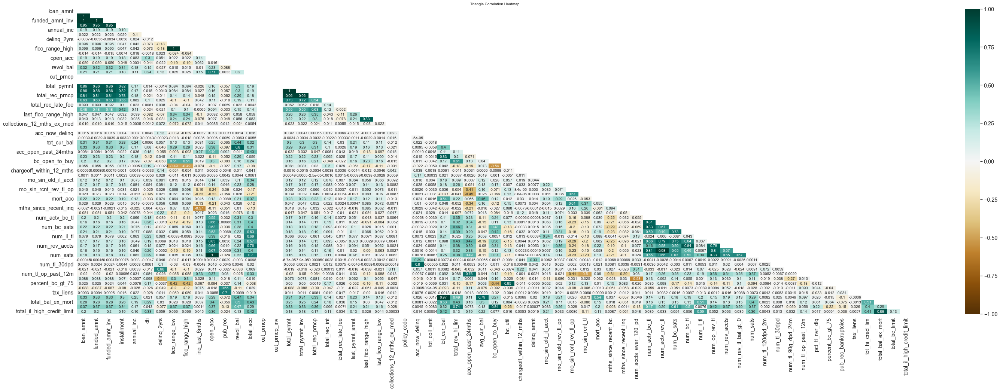

In [ ]:
# Plotting the correlation coeficients as a heatmap
plt.figure(figsize=(50, 15))
mask = np.triu(np.ones_like(loan_data.corr(numeric_only=True), dtype=bool))  # creates a triangular matrix based on the pandas correlation matrix

heatmap = sns.heatmap(loan_data.corr(numeric_only=True), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

In [ ]:
# Correlation matrix
loan_data.corr(numeric_only=True)

,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
loan_amnt,1.000000,0.999681,0.998955,0.952108,0.192742,0.021997,-0.003705,0.096140,0.096140,-0.013696,...,-0.021164,-0.020016,0.088108,0.024546,-0.087503,0.009279,0.334117,0.275303,0.372414,0.201918
funded_amnt,0.999681,1.000000,0.999340,0.952576,0.192716,0.022355,-0.003563,0.095538,0.095537,-0.013909,...,-0.021165,-0.020017,0.088108,0.024545,-0.087359,0.009373,0.334116,0.275303,0.372420,0.201916
funded_amnt_inv,0.998955,0.999340,1.000000,0.951821,0.192605,0.023178,-0.003369,0.094857,0.094856,-0.014615,...,-0.021181,-0.020029,0.088130,0.024498,-0.087111,0.009529,0.334145,0.275309,0.372454,0.201921
installment,0.952108,0.952576,0.951821,1.000000,0.186596,0.028693,0.005784,0.046704,0.046704,0.007371,...,-0.015626,-0.000865,0.070338,0.043692,-0.079905,0.016012,0.301633,0.260383,0.340744,0.187643
annual_inc,0.192742,0.192716,0.192605,0.186596,1.000000,-0.100800,0.023776,0.041837,0.041837,0.018070,...,0.003331,0.031243,-0.003734,-0.007577,-0.026194,0.022391,0.249522,0.193264,0.166560,0.162997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tax_liens,0.009279,0.009373,0.009529,0.016012,0.022391,-0.028437,0.011255,-0.058642,-0.058641,0.011028,...,0.001902,0.014635,-0.033372,-0.012421,0.033684,1.000000,-0.000595,-0.001313,-0.025771,0.005672
tot_hi_cred_lim,0.334117,0.334116,0.334145,0.301633,0.249522,0.020688,0.057183,0.190629,0.190629,0.032877,...,0.004892,0.096975,0.026377,-0.015286,-0.103438,-0.000595,1.000000,0.513953,0.402774,0.413650
total_bal_ex_mort,0.275303,0.275303,0.275309,0.260383,0.193264,0.292985,0.030040,0.027677,0.027675,0.037166,...,0.015613,0.118708,0.061391,0.063971,-0.074893,-0.001313,0.513953,1.000000,0.290604,0.876777
total_bc_limit,0.372414,0.372420,0.372454,0.340744,0.166560,0.043444,-0.077020,0.373745,0.373745,0.001377,...,-0.059217,0.055633,0.215289,-0.216591,-0.145467,-0.025771,0.402774,0.290604,1.000000,0.133793


In [ ]:
# Saving the preprocessed dataset
# if you want to keep the reference for the row indices from the original dataset, remove the index=False
loan_data.to_csv(r'D:\pythonenv\datasets\Loan_status_pre.csv', index=False)



**2.3 Main conclusions from the exploratory data analysis**

After exploring the dataset, the following findings can be highlighted along with their respective remediation:

1. There are features that should not be known during the moment of the loan request (such as payments received so far) that need to be removed from the dataset before training the model.

2. The dataset has a 4:1 ratio of loan request that have been successfully paid vs. not paid, i.e., the dataset is extremely unbalanced. Undersampling can be a potential approach to address this unbalance.

3. There are no duplicated records in the dataset.

4. Several features have a severe rate of missing values that need to be treated accordingly. Literature suggests that a 10% rate of missing values can bias the training while values above 40% can be impractical.

5. There are 57 numeric features and 23 non numeric features to be used for training the model.

6. The order of magnitude of the numeric features varies considerably. Feature scaling is recommended depending of the machine learning algorithm selected.

6. Box plot analysis of the numeric features has revealed that several features contain outliers but the will be kept as they represent real values and not noise.

7. Few non numeric features such as interest rate are percentage values that need to be cleaned (i.e., remove the percentage % character).

8. Most of the non numeric features have a categorical nature and will need to be encoded for the machine learning training.

## **3. Cleaning and preprocessing the dataset**

The exploratory data analysis has provided important insights for the cleaning and preprocessing of the dataset. This section covers the main stages of the cleaning and preprocessing pipeline, namely:

1.   Cleaning and fixing fields with incorrect data type
2.   Undersampling for balancing the classes and eliminating missing values
3.   Creation of traning and test samples
4.   Enconding of categorical variables
5.   Feature scaling

In [ ]:
# Loading the preprocessed dataset
loan_data_pre = pd.read_csv(r'D:\pythonenv\datasets\Loan_status_pre.csv', low_memory=False)
#loan_data_pre = loan_data

In [ ]:
# Validating the shape of the preprocessed dataset
loan_data_pre.shape

(1790838, 73)

In [ ]:
# Visualizing the preprocessed dataset
loan_data_pre.head()

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,5000.0,5000.0,4975.0,36 months,10.65%,162.87,B,B2,NaN,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,2500.0,2500.0,2500.0,60 months,15.27%,59.83,C,C4,Ryder,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,2400.0,2400.0,2400.0,36 months,15.96%,84.33,C,C5,NaN,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,10000.0,10000.0,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,3000.0,3000.0,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


**3.1 Cleaning characters and fixing data types**

In [ ]:
# Listing features with incorrect data type and/or percentage values
list_tonum = ['id','int_rate','revol_util']
loan_data_pre[list_tonum]

,id,int_rate,revol_util
0,1077501,10.65%,83.7%
1,1077430,15.27%,9.4%
2,1077175,15.96%,98.5%
3,1076863,13.49%,21%
4,1075358,12.69%,53.9%
...,...,...,...
1790833,102556443,23.99%,24.9%
1790834,102653304,7.99%,15.7%
1790835,102628603,16.99%,47%
1790836,102196576,11.44%,10.1%


In [ ]:
# Cleaning the percentage % character
list_pctg = ['int_rate','revol_util']

for field in list_pctg:
    loan_data_pre[field] = loan_data_pre[field].str.removesuffix('%')


for field in list_tonum:
    loan_data_pre[field] = pd.to_numeric(loan_data_pre[field], errors='coerce')

loan_data_pre[list_tonum].dtypes

id              int64
int_rate      float64
revol_util    float64
dtype: object

In [ ]:
# Visualizing the cleaned features
loan_data_pre[list_tonum]

,id,int_rate,revol_util
0,1077501,10.65,83.7
1,1077430,15.27,9.4
2,1077175,15.96,98.5
3,1076863,13.49,21.0
4,1075358,12.69,53.9
...,...,...,...
1790833,102556443,23.99,24.9
1790834,102653304,7.99,15.7
1790835,102628603,16.99,47.0
1790836,102196576,11.44,10.1


**3.2 Addressing the class imbalance and missing values**

In [ ]:
# Filtering only the records with non null values
column_list = list(loan_data_pre)
loan_data_pre = loan_data_pre[loan_data_pre[column_list].notnull().all(1)]
loan_data_pre.shape

(1322564, 73)

In [ ]:
# Checking the distribution of classes
loan_data_pre['loan_status'].value_counts()

loan_status
Fully Paid     1070079
Charged Off     252485
Name: count, dtype: int64

In [ ]:
# Undersampling
loan_data_majority = loan_data_pre[(loan_data_pre['loan_status']=='Fully Paid')]
loan_data_minority = loan_data_pre[(loan_data_pre['loan_status']=='Charged Off')]
loan_data_majority_undersampled = resample (loan_data_majority, replace=False, n_samples=252485, random_state=42)

loan_data_pre = pd.concat([loan_data_majority_undersampled,loan_data_minority])
loan_data_pre.info()


<class 'pandas.core.frame.DataFrame'>
Index: 504970 entries, 1578991 to 1790837
Data columns (total 73 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   id                          504970 non-null  int64  
 1   loan_amnt                   504970 non-null  float64
 2   funded_amnt                 504970 non-null  float64
 3   funded_amnt_inv             504970 non-null  float64
 4   term                        504970 non-null  object 
 5   int_rate                    504970 non-null  float64
 6   installment                 504970 non-null  float64
 7   grade                       504970 non-null  object 
 8   sub_grade                   504970 non-null  object 
 9   emp_title                   504970 non-null  object 
 10  emp_length                  504970 non-null  object 
 11  home_ownership              504970 non-null  object 
 12  annual_inc                  504970 non-null  float64
 13  verification

In [ ]:
# Visualing the undersampled dataset
loan_data_pre.head()

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
1578991,93969848,1200.0,1200.0,1200.0,36 months,11.49,39.57,B,B5,Educational Assistant,...,0.0,2.0,100.0,0.0,0.0,0.0,92732.0,81971.0,5200.0,75532.0
280172,113246203,22000.0,22000.0,22000.0,36 months,10.42,714.23,B,B3,Air traffic controller,...,0.0,0.0,94.7,100.0,0.0,3.0,78700.0,53352.0,19300.0,53400.0
267019,114785451,5000.0,5000.0,5000.0,36 months,7.97,156.62,A,A5,production worker,...,0.0,2.0,100.0,0.0,0.0,0.0,98619.0,11577.0,2500.0,16819.0
299423,125236475,35000.0,35000.0,35000.0,36 months,7.35,1086.31,A,A4,field mechanic,...,0.0,4.0,100.0,0.0,0.0,0.0,442003.0,95338.0,14200.0,123166.0
453053,140492135,19200.0,19200.0,19200.0,60 months,10.47,412.40,B,B2,Ecosystem Engineer,...,0.0,1.0,100.0,66.7,0.0,0.0,636946.0,63164.0,18500.0,81227.0


In [ ]:
# Validating the new proportion of classes
df_plot = loan_data_pre.groupby('loan_status').agg(amnt=('loan_status', 'count'))
df_plot = df_plot.reset_index().drop(['loan_status'], axis=1)
df_plot

,amnt
0,252485
1,252485


In [ ]:
# Validating that there are no null values anymore
missing_rate_pre = loan_data_pre.isnull().mean().sort_values(ascending=False)
missing_rate_pre.head()

id                       0.0
total_rev_hi_lim         0.0
num_actv_rev_tl          0.0
num_actv_bc_tl           0.0
num_accts_ever_120_pd    0.0
dtype: float64

**3.3 Creating the training and test samples**

In [ ]:
# Stratified sampling
from sklearn.model_selection import train_test_split

loan_data_train, loan_data_test = train_test_split(loan_data_pre, test_size=0.2, stratify=loan_data_clean['loan_status'], random_state=42)

In [ ]:
# Validating the shape of the training set
loan_data_train.shape

(403976, 73)

In [ ]:
# Visualizing the training set
loan_data_train.head()

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
1096300,48676899,8000.0,8000.0,8000.0,36 months,13.33,270.83,C,C3,Family Services Coordinator,...,0.0,3.0,71.4,0.0,0.0,0.0,275930.0,115457.0,2000.0,106030.0
1180306,41031798,10000.0,10000.0,10000.0,60 months,9.99,212.43,B,B3,SALES AGENT,...,0.0,4.0,97.3,80.0,1.0,0.0,188769.0,14748.0,11400.0,8458.0
295580,112007797,14375.0,14375.0,14375.0,36 months,21.45,544.91,D,D5,Quality Analyst,...,0.0,1.0,100.0,100.0,0.0,0.0,134705.0,129575.0,17000.0,109705.0
883774,64701174,12250.0,12250.0,12250.0,36 months,13.18,413.82,C,C3,pure operator,...,0.0,2.0,100.0,0.0,1.0,0.0,41245.0,26856.0,2000.0,25445.0
1126489,46507116,5000.0,5000.0,5000.0,36 months,12.69,167.73,C,C2,Operations Tech,...,0.0,3.0,100.0,100.0,0.0,0.0,46233.0,32585.0,4500.0,26533.0


In [ ]:
# Validating the proportion of classes in the training set
loan_data_train['loan_status'].value_counts() / len(loan_data_train['loan_status'])

loan_status
Fully Paid     0.5
Charged Off    0.5
Name: count, dtype: float64

In [ ]:
# Validating the shape of the test set
loan_data_test.shape

In [ ]:
# Visualizing the test set
loan_data_test.head()

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
604350,35938516,20000.0,20000.0,20000.0,36 months,11.44,658.95,B,B4,Medical Laboratory Technologist,...,0.0,2.0,87.5,33.3,0.0,0.0,77623.0,44557.0,16500.0,35423.0
494958,145335523,9000.0,9000.0,9000.0,36 months,24.37,354.85,E,E2,Pre-Tax Benefits Consultant,...,0.0,0.0,100.0,80.0,0.0,0.0,56417.0,28582.0,9000.0,43517.0
1690077,96632733,10000.0,10000.0,10000.0,36 months,8.24,314.48,B,B1,Sales manager - North America,...,0.0,6.0,100.0,10.0,0.0,0.0,128550.0,46372.0,63300.0,51350.0
230664,119341798,24900.0,24900.0,24875.0,36 months,30.75,1067.30,F,F5,technician,...,0.0,1.0,92.9,0.0,0.0,0.0,27500.0,14547.0,9200.0,12000.0
601286,36200416,25000.0,25000.0,25000.0,60 months,24.50,726.48,F,F3,ANALYST,...,0.0,13.0,96.9,50.0,1.0,0.0,150978.0,130853.0,9500.0,119678.0


In [ ]:
# Validating the proportion of classes in the test set
loan_data_test['loan_status'].value_counts() / len(loan_data_test['loan_status'])

loan_status
Charged Off    0.5
Fully Paid     0.5
Name: count, dtype: float64

In [ ]:
# Saving the training and test sets
# if you want to keep the reference for the row indices from the original dataset, remove the index=False
loan_data_train.to_csv(r'D:\pythonenv\datasets\loan_data_train.csv', index=False)
loan_data_test.to_csv(r'D:\pythonenv\datasets\loan_data_test.csv', index=False)

**3.4 Enconding the categorical attributes**



In [ ]:
# Loading the training set
loan_data_train = pd.read_csv(r'D:\pythonenv\datasets\loan_data_train.csv', low_memory=False)


In [ ]:
# Precoding the classes
binary_data = loan_data_train.loan_status.replace({'Fully Paid' : 'n', 'Charged Off' : 'y'})
loan_data_train['loan_status'] = binary_data
loan_data_train.loan_status.unique()


array(['n', 'y'], dtype=object)

In [ ]:
# Confirming the prenconding was successful
values_list = loan_data_train['loan_status'].isin(['y','n'])
loan_data_train = loan_data_train[values_list]
loan_data_train.shape

(403976, 73)

In [ ]:
# Listing the non numeric features to be enconded
df_datatypes_train = pd.DataFrame(loan_data_train.dtypes, columns=['data_type'])
df_object_train = df_datatypes_train[df_datatypes_train['data_type'] == 'object']
df_object_train

,data_type
term,object
grade,object
sub_grade,object
emp_title,object
emp_length,object
home_ownership,object
verification_status,object
loan_status,object
purpose,object
title,object


In [ ]:
# Listing the categorical values to be enconded
for atribute in list(df_object_train.index.values):
    print(f'{atribute} ==> {loan_data_train[atribute].unique()}')

term ==> [' 36 months' ' 60 months']
grade ==> ['C' 'B' 'D' 'A' 'E' 'F' 'G']
sub_grade ==> ['C3' 'B3' 'D5' 'C2' 'A3' 'D2' 'C5' 'C4' 'B2' 'E1' 'E4' 'A5' 'B5' 'D3'
 'A4' 'B1' 'C1' 'E3' 'D4' 'E2' 'B4' 'A2' 'E5' 'A1' 'F2' 'F1' 'G3' 'F4'
 'D1' 'G2' 'F3' 'G4' 'F5' 'G5' 'G1']
emp_title ==> ['Family Services Coordinator  ' 'SALES AGENT' 'Quality Analyst' ...
 'intex solutions' 'Case coordinator' 'gas mechanic']
emp_length ==> ['3 years' '10+ years' '5 years' '1 year' '8 years' '< 1 year' '2 years'
 '6 years' '7 years' '4 years' '9 years']
home_ownership ==> ['MORTGAGE' 'RENT' 'OWN' 'ANY' 'NONE' 'OTHER']
verification_status ==> ['Not Verified' 'Source Verified' 'Verified']
loan_status ==> ['n' 'y']
purpose ==> ['debt_consolidation' 'credit_card' 'other' 'home_improvement'
 'major_purchase' 'moving' 'house' 'medical' 'vacation' 'small_business'
 'wedding' 'car' 'renewable_energy' 'educational']
title ==> ['Debt consolidation' 'Credit card refinancing' 'Other' ... 'Debt resolve'
 'Buying a used c

In [ ]:
# Enconding the categorical features
for atribute in list(df_object_train.index.values):
    loan_data_train[atribute]=loan_data_train[atribute].astype('category').cat.codes
    print(f'{atribute} ==> {loan_data_train[atribute].unique()}')

term ==> [0 1]
grade ==> [2 1 3 0 4 5 6]
sub_grade ==> [12  7 19 11  2 16 14 13  6 20 23  4  9 17  3  5 10 22 18 21  8  1 24  0
 26 25 32 28 15 31 27 33 29 34 30]
emp_title ==> [ 40170  89042  83049 ... 126065  17506 124763]
emp_length ==> [ 3  1  5  0  8 10  2  6  7  4  9]
home_ownership ==> [1 5 4 0 2 3]
verification_status ==> [0 1 2]
loan_status ==> [0 1]
purpose ==> [ 2  1  9  4  6  8  5  7 12 11 13  0 10  3]
title ==> [3099 2270 6242 ... 3239  818 5594]
zip_code ==> [711   2 457 138 299 194 217 856 282 427 682 702 867 204 283 672 827 259
 312 443 706 438  44 802  67 105 100 501 419 179 809 305 820 307 503 107
 496 836 333 854 580 331 433 865 464 310 805 841  88 826 439 460 550 789
 835 265 449 775 196 297 382 858 718 121 579 459 768 846 212 823 597  98
 555 705  95 864 400 730 728 853 716 315  61 606 246 113 740  92 897 318
 875 628 258  71 262 859 834 134 745  19 200 302 845 851 857 288 301 290
 832 191 404 553 412 806 250 889 184 584 344  29 395 594 346 103 581 101
 502 351 683

In [ ]:
# Confirming that all features are numeric now
loan_data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 403976 entries, 0 to 403975
Data columns (total 73 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   id                          403976 non-null  int64  
 1   loan_amnt                   403976 non-null  float64
 2   funded_amnt                 403976 non-null  float64
 3   funded_amnt_inv             403976 non-null  float64
 4   term                        403976 non-null  int8   
 5   int_rate                    403976 non-null  float64
 6   installment                 403976 non-null  float64
 7   grade                       403976 non-null  int8   
 8   sub_grade                   403976 non-null  int8   
 9   emp_title                   403976 non-null  int32  
 10  emp_length                  403976 non-null  int8   
 11  home_ownership              403976 non-null  int8   
 12  annual_inc                  403976 non-null  float64
 13  verification_s

In [ ]:
# Visualizing the training set
loan_data_train.head()

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,48676899,8000.0,8000.0,8000.0,0,13.33,270.83,2,12,40170,...,0.0,3.0,71.4,0.0,0.0,0.0,275930.0,115457.0,2000.0,106030.0
1,41031798,10000.0,10000.0,10000.0,1,9.99,212.43,1,7,89042,...,0.0,4.0,97.3,80.0,1.0,0.0,188769.0,14748.0,11400.0,8458.0
2,112007797,14375.0,14375.0,14375.0,0,21.45,544.91,3,19,83049,...,0.0,1.0,100.0,100.0,0.0,0.0,134705.0,129575.0,17000.0,109705.0
3,64701174,12250.0,12250.0,12250.0,0,13.18,413.82,2,12,131322,...,0.0,2.0,100.0,0.0,1.0,0.0,41245.0,26856.0,2000.0,25445.0
4,46507116,5000.0,5000.0,5000.0,0,12.69,167.73,2,11,72321,...,0.0,3.0,100.0,100.0,0.0,0.0,46233.0,32585.0,4500.0,26533.0


**3.5 Feature scaling**

In [ ]:
# Getting the independent (features) and dependent variables (outcome)
y_train = loan_data_train['loan_status'].values
x_train = loan_data_train.drop(columns=['id', 'loan_status'])



In [ ]:
# Verifying the data type for the features
type(x_train)

pandas.core.frame.DataFrame

In [ ]:
# Verifying the shape of the features
x_train.shape

(403976, 71)

In [ ]:
# Verifying the data type for the outcome
type(y_train)

numpy.ndarray

In [ ]:
# Verifying the shape of the outcome
y_train.shape

(403976,)

In [ ]:
# Feature scaling
x_train_std = RobustScaler().fit_transform(x_train)
x_train_std

array([[-0.51391863, -0.51391863, -0.5117773 , ...,  1.72986252,
        -0.66169154,  1.6367083 ],
       [-0.34261242, -0.34261242, -0.34047109, ..., -0.60405212,
        -0.19402985, -0.63277743],
       [ 0.03211991,  0.03211991,  0.03426124, ...,  2.05704486,
         0.08457711,  1.72218733],
       ...,
       [-0.42826552, -0.42826552, -0.4261242 , ..., -0.01673223,
         0.42288557,  0.39752983],
       [ 1.37044968,  1.37044968,  1.37259101, ...,  0.09969815,
        -0.00995025, -0.14102296],
       [-1.09635974, -1.09635974, -1.09421842, ..., -0.43374024,
        -0.63681592, -0.34642849]])

**3.6 Summary of the preprocessing and cleaning of the dataset**

In this step the dataset was sliced and reduced only to the attributes that help predict the risk of loan request. This should contribute to a more efficient training of the models:

* The features with percentage values were cleaned and correctly typed as numeric features so their values can be considered quantitatively in the training.

* The class imbalance was addressed via undersampling and since the dataset had a very large number of records, the missing value issue was addressed via undersampling as well by only selecting records with non null values.

* Training and test samples were extracted before enconding and feature scalling to avoid data leakage from the training into the test sample. A Stratified sampling approach was used to make sure the class imbalance was maintained in the training and test samples.

* The categorical features were enconded and converted into numerical values so they can be considered for the subsequent training of the machine learning model.

* A robust scalling approach was used for feature scalling of the numeric fatures to ensure that they are robust to the outliers indentified during the exploratory data analysis.

Taken together, all the actions performed during the preprocessing and cleaning step should contribute to a more efficient and precise training of the machine learning model.



#**4. Training and validating the model**

Since the objective of the machine learning model is to predict one of the two classes that correspond whether the individual requesting a loan will fully paid it or not (i.e., a binominal classification), the following machine learning algorithms were selected the training of the model: KNN, SVM, Logistic Regression and Decision Tree.

For cross validation, each algorithm was subjected to five (5) training sets randomly splitted with no stratification (i.e. five folds). Therefore each algorithm was used for training and evaluation five times, picking a different fold (validation set) for evaluation every time and training on the other 4 folds (train-dev set). The result is an array containing the 5 evaluation scores.

Therefore, a function was created to print the cross validation results, i.e., the accuracy scores, their mean and standard deviation. The mean and standard deviation values were used to compare the four algorithms.

In [ ]:
# printing function
def display_scores(scores):
    print("Scores:", scores)
    print("\nMean:", scores.mean())
    print("Standard deviation:", scores.std())

**4.1 First algorithm: KNN**





In [ ]:
# Training the KNN model
knn = KNeighborsClassifier()  # default hyperparameters --> k=5
# stratified 5-fold
knn_accs = cross_val_score(knn, x_train_std, y_train, cv=5, scoring='accuracy')

display_scores(knn_accs)

Scores: [0.74736373 0.746717   0.74940281 0.74922953 0.75088805]

Mean: 0.7487202243610847
Standard deviation: 0.0015018500286408617


**4.2 Second algorithm: SVM**

In [ ]:
# Training the SVM model
svm = LinearSVC(max_iter=10000)  # C=1.0, loss='squared hinge'
svm_accs = cross_val_score(svm, x_train_std, y_train, scoring="accuracy", cv=5)

display_scores(svm_accs)

D:\pythonenv\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
D:\pythonenv\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
D:\pythonenv\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
D:\pythonenv\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Scores: [0.82996683 0.84177239 0.80977783 0.83371496 0.84844359]

Mean: 0.8327351198296181
Standard deviation: 0.013146017091413425


D:\pythonenv\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


**4.3 Third algorithm: Logistic Regression**

In [ ]:
# Training the Logistic Regression model
lr = LogisticRegression(max_iter=10000, random_state=42)
lr_accs = cross_val_score(lr, x_train_std, y_train, scoring="accuracy", cv=5)

display_scores(lr_accs)

Scores: [0.88293975 0.8866514  0.88520329 0.88238134 0.8878891 ]

Mean: 0.8850129761996424
Standard deviation: 0.0021079165106148755


**4.4 Forth algorithm: Decision Tree**

In [ ]:
# Training the Decision Tree model
dt = DecisionTreeClassifier(random_state=42)
dt_accs = cross_val_score(dt, x_train_std, y_train, scoring="accuracy", cv=5)

display_scores(dt_accs)

Scores: [0.82286252 0.82122656 0.82357819 0.82122656 0.82489015]

Mean: 0.8227567971718102
Standard deviation: 0.001408568267525297


**4.5 Results and Discussion**

The first model using KNN has shown an mean accuracy value of 74.8% which was the lowest among the four models evaluated. This could be due to the fact that in high dimensional settings as the one being investigated, the accuracy of KNN are affected by nuisance features. Therefore, this algorithm was not considered for further analysis.

The second model trained using SVM has demonstrated a better mean accuracy value of 83.3%, marginally superior to the mean accuracy of the Decision Tree of 82.3%. However, the Decision Tree model has emerged as a superior alternative given that it not only deals better with categorical data (almost 30% of the features are categorical), but it also converged much faster than SVM, thus making the Decision Tree model more efficient from a computing resources perspective.

Lastly, the model trained using Logistic Regression has shown the higher mean accuracy value (88.5%), suggesting that this algorithm could be the best one among the four algorithms being tested. However, since all the model are still somewhat underfitted, a fine-tuning step was suggested in an attempt to improve the accuracy of the Logistic Regression model by leveraging only the most important features according to the Decision Tree model. This is illustrated in the next section of the notebook.


**4.6 Fine-tuning via feature importance**

In an attempt to improve the quality of the Logistic Regression model, a Decision Tree Model was trained and evaluated against the test set to generate a feature importance list showing the most important features to segregate the two outcome classes.

Next, only the most important features were used to train and evaluate a final Logistic Regression model against the test set.


In [ ]:
# Loading the test set
loan_data_test = pd.read_csv(r'D:\pythonenv\datasets\loan_data_test.csv', low_memory=False)

In [ ]:
# Precoding the classes in the test set
binary_data = loan_data_test.loan_status.replace({'Fully Paid' : 'n', 'Charged Off' : 'y'})
loan_data_test['loan_status'] = binary_data
loan_data_test.loan_status.unique()


array(['y', 'n'], dtype=object)

In [ ]:
# Confirming the prenconding was successful
values_list = loan_data_test['loan_status'].isin(['y','n'])
loan_data_test = loan_data_test[values_list]
loan_data_test.shape

(100994, 73)

In [ ]:
# Listing the non numeric features of the test set
df_datatypes_test = pd.DataFrame(loan_data_test.dtypes, columns=['data_type'])
df_object_test = df_datatypes_test[df_datatypes_test['data_type'] == 'object']
df_object_test

,data_type
term,object
grade,object
sub_grade,object
emp_title,object
emp_length,object
home_ownership,object
verification_status,object
loan_status,object
purpose,object
title,object


In [ ]:
# Listing the categorical values of the non numeric features
for atribute in list(df_object_test.index.values):
    print(f'{atribute} ==> {loan_data_test[atribute].unique()}')

term ==> [' 36 months' ' 60 months']
grade ==> ['B' 'E' 'F' 'D' 'A' 'C' 'G']
sub_grade ==> ['B4' 'E2' 'B1' 'F5' 'F3' 'D5' 'E5' 'A1' 'C2' 'D4' 'D1' 'A5' 'C5' 'D2'
 'B2' 'E1' 'B5' 'C4' 'A3' 'A2' 'A4' 'G5' 'F2' 'E3' 'C3' 'B3' 'E4' 'C1'
 'D3' 'F1' 'F4' 'G2' 'G3' 'G1' 'G4']
emp_title ==> ['Medical Laboratory Technologist' 'Pre-Tax Benefits Consultant'
 'Sales manager - North America ' ... 'Project mgr III'
 'FIRE SAFETY DIRECTOR' 'Senior patient coordinator ']
emp_length ==> ['5 years' '8 years' '10+ years' '2 years' '1 year' '6 years' '7 years'
 '9 years' '3 years' '4 years' '< 1 year']
home_ownership ==> ['RENT' 'MORTGAGE' 'OWN' 'ANY' 'NONE' 'OTHER']
verification_status ==> ['Source Verified' 'Not Verified' 'Verified']
loan_status ==> ['y' 'n']
purpose ==> ['debt_consolidation' 'credit_card' 'other' 'small_business' 'car'
 'home_improvement' 'medical' 'vacation' 'major_purchase' 'moving' 'house'
 'renewable_energy' 'wedding']
title ==> ['Debt consolidation' 'Credit card refinancing' 'Othe

In [ ]:
# Enconding the categorical features
for atribute in list(df_object_test.index.values):
    loan_data_test[atribute]=loan_data_test[atribute].astype('category').cat.codes
    print(f'{atribute} ==> {loan_data_test[atribute].unique()}')

term ==> [0 1]
grade ==> [1 4 5 3 0 2 6]
sub_grade ==> [ 8 21  5 29 27 19 24  0 11 18 15  4 14 16  6 20  9 13  2  1  3 34 26 22
 12  7 23 10 17 25 28 31 32 30 33]
emp_title ==> [20680 24772 28917 ... 25755 12390 30564]
emp_length ==> [ 5  8  1  2  0  6  7  9  3  4 10]
home_ownership ==> [5 1 4 0 2 3]
verification_status ==> [1 0 2]
loan_status ==> [1 0]
purpose ==> [ 2  1  8 10  0  3  6 11  5  7  4  9 12]
title ==> [1065  778 1973 ... 1984 2488  760]
zip_code ==> [858  78 800 803 301 794 824  60 762 345 540  45 335 171 704 216 179 865
 565 761 213 786 263 623 313  90 590 692 651 372 414 452 868 593 304 542
 853 185 266 210 136 792 334 670 760 512 128 316   6 307 434  71 126 845
 820 840  86  12 681 222 566 450 110 261 829  98 825 536 768 495  97 402
 331 200 306 453 796   8 556  47 186 848 369 314 187 836 717 324 828 669
 823 193 479 100 492  54 338 574 138 567 317  58 201 132  62  70 310 420
 169 275 260  33 726 348 431 814 645 752 668 320 494 688 103 424 282  96
 817 679  91  68 151 

In [ ]:
# Validating that the test set only contains numeric features
loan_data_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100994 entries, 0 to 100993
Data columns (total 73 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   id                          100994 non-null  int64  
 1   loan_amnt                   100994 non-null  float64
 2   funded_amnt                 100994 non-null  float64
 3   funded_amnt_inv             100994 non-null  float64
 4   term                        100994 non-null  int8   
 5   int_rate                    100994 non-null  float64
 6   installment                 100994 non-null  float64
 7   grade                       100994 non-null  int8   
 8   sub_grade                   100994 non-null  int8   
 9   emp_title                   100994 non-null  int32  
 10  emp_length                  100994 non-null  int8   
 11  home_ownership              100994 non-null  int8   
 12  annual_inc                  100994 non-null  float64
 13  verification_s

In [ ]:
# Visualizing the test set
loan_data_test.head()

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,35938516,20000.0,20000.0,20000.0,0,11.44,658.95,1,8,20680,...,0.0,2.0,87.5,33.3,0.0,0.0,77623.0,44557.0,16500.0,35423.0
1,145335523,9000.0,9000.0,9000.0,0,24.37,354.85,4,21,24772,...,0.0,0.0,100.0,80.0,0.0,0.0,56417.0,28582.0,9000.0,43517.0
2,96632733,10000.0,10000.0,10000.0,0,8.24,314.48,1,5,28917,...,0.0,6.0,100.0,10.0,0.0,0.0,128550.0,46372.0,63300.0,51350.0
3,119341798,24900.0,24900.0,24875.0,0,30.75,1067.30,5,29,42699,...,0.0,1.0,92.9,0.0,0.0,0.0,27500.0,14547.0,9200.0,12000.0
4,36200416,25000.0,25000.0,25000.0,1,24.50,726.48,5,27,470,...,0.0,13.0,96.9,50.0,1.0,0.0,150978.0,130853.0,9500.0,119678.0


In [ ]:
# Getting the independent (features) and dependent variables (outcome)
y_test = loan_data_test['loan_status'].values
x_test = loan_data_test.drop(columns=['id', 'loan_status'])


In [ ]:
# Verifying the date type of the features
type(x_test)

pandas.core.frame.DataFrame

In [ ]:
# Verifying the shape of the features
x_test.shape

(100994, 71)

In [ ]:
# Verifying the date type of the outcome
type(y_test)

numpy.ndarray

In [ ]:
# Verifying the shape of the outcome
y_test.shape

(100994,)

In [ ]:
# Feature scaling
x_test_std = RobustScaler().fit_transform(x_test)
x_test_std

array([[ 0.53017241,  0.53017241,  0.53232759, ...,  0.09263339,
         0.065     , -0.00336219],
       [-0.41810345, -0.41810345, -0.41594828, ..., -0.27880697,
        -0.31      ,  0.18562081],
       [-0.33189655, -0.33189655, -0.32974138, ...,  0.1348346 ,
         2.405     ,  0.36850984],
       ...,
       [ 1.21982759,  1.21982759,  1.22198276, ...,  0.3377724 ,
         0.355     , -0.05820788],
       [ 1.39224138,  1.39224138,  1.39439655, ..., -0.00869601,
         0.79      , -0.30509523],
       [-0.50431034, -0.50431034, -0.50215517, ...,  0.36876646,
        -0.12      ,  0.36617499]])

In [ ]:
# Training the Decision Tree model
dt.fit(x_train, y_train)

DecisionTreeClassifier(random_state=42)

In [ ]:
# Predicting the outcome via the Decision Tree model
y_test_pred = dt.predict(x_test)
y_test_predProba = dt.predict_proba(x_test)

In [ ]:
# Visualizing the outcome array
y_test_pred

array([1, 0, 0, ..., 0, 0, 1], dtype=int8)

In [ ]:
# Visualizing the class probabilities array
y_test_predProba

array([[0., 1.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [1., 0.],
       [0., 1.]])

In [ ]:
# Assessment of the Decision Tree model
print(classification_report(y_test, y_test_pred, digits=3, target_names=['Fully Paid', 'Charged Off']))

              precision    recall  f1-score   support

  Fully Paid      0.797     0.818     0.807     50497
 Charged Off      0.813     0.792     0.802     50497

    accuracy                          0.805    100994
   macro avg      0.805     0.805     0.805    100994
weighted avg      0.805     0.805     0.805    100994



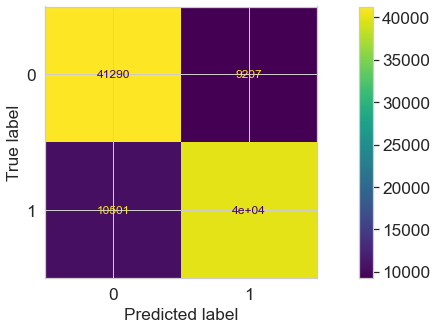

In [ ]:
# Confusion matrix for the Decision Tree model
cm = confusion_matrix(y_test, y_test_pred, labels=dt.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=dt.classes_, )
disp.plot()
plt.show()

In [ ]:
# Sorting features by its importance in the Decision Tree model
df_featImport = pd.DataFrame(columns=['feature', 'feat_importance'])
df_featImport['feature'] = x_test.columns
df_featImport['feat_importance'] = dt.feature_importances_
df_featImport = df_featImport.sort_values(by='feat_importance', ascending=False)
df_featImport[0:10]

,feature,feat_importance
28,last_fico_range_high,0.632396
5,installment,0.015038
17,dti,0.014057
3,term,0.012430
8,emp_title,0.012099
43,mo_sin_old_rev_tl_op,0.011237
15,zip_code,0.011167
19,earliest_cr_line,0.011085
11,annual_inc,0.010126
42,mo_sin_old_il_acct,0.010019


This is the meaning for each feature listed above:

* last_fico_range_high: The upper boundary range the borrower’s last FICO pulled belongs to.

* installment: The monthly payment owed by the borrower if the loan originates.

* dti: A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.

* term: The number of payments on the loan. Values are in months and can be either 36 or 60.

* emp_title: The job title supplied by the Borrower when applying for the loan.

* mo_sin_old_rev_tl_op: Months since oldest revolving account opened

* zip_code: The first 3 numbers of the zip code provided by the borrower in the loan application.

* earliest_cr_line: The month the borrower's earliest reported credit line was opened

* annual_inc: The self-reported annual income provided by the borrower during registration.

* mo_sin_old_il_acct: Months since oldest bank installment account opened




In [ ]:
# Plotting the feature importance
df_featImport[0:10].hvplot(kind = 'bar', title="Feature Importance", x='feature', y='feat_importance',
    width=1000, height=350
)

:Bars   [feature]   (feat_importance)

In [ ]:
# Visualizing the importance of the features to segregate the classes
features_list = df_featImport['feature'].iloc[0:5]

list_fullypaid = loan_data_clean['loan_status'] == 0
df_fullypaid = loan_data_clean[list_fullypaid]
df_fullypaid_stat= df_fullypaid[features_list]

list_chargedoff = loan_data_clean['loan_status'] == 1
df_chargedoff = loan_data_clean[list_chargedoff]
df_chargedoff_stat= df_chargedoff[features_list]

In [ ]:
# Visualizing the importance of "last_fico_range_high"
 (df_fullypaid_stat.hvplot.scatter(y='last_fico_range_high') * df_chargedoff_stat.hvplot.scatter(y='last_fico_range_high'))

:Overlay
   .Scatter.I  :Scatter   [index]   (last_fico_range_high)
   .Scatter.II :Scatter   [index]   (last_fico_range_high)

In [ ]:
# Visualizing the importance of "installment"
 (df_fullypaid_stat.hvplot.scatter(y='installment') * df_chargedoff_stat.hvplot.scatter(y='installment'))

:Overlay
   .Scatter.I  :Scatter   [index]   (installment)
   .Scatter.II :Scatter   [index]   (installment)

**4.7 Evaluating the fine tuned Logistic Regression model in the test set

Since the Decision Tree model has shown that five features are responsible for nearly 70% of the segregation between the two classes, these five features were taken further for the training of a new fine tuned Logistic Regression model.

In [ ]:
# Listing the five most important features
list_vars = df_featImport.iloc[0:5,0]
list_vars

28    last_fico_range_high
5              installment
17                     dti
3                     term
8                emp_title
Name: feature, dtype: object

In [ ]:
# Visualizing the training set with the five most important features
x_trainLG = x_train[list_vars]
x_trainLG

,last_fico_range_high,installment,dti,term,emp_title
0,629.0,270.83,16.81,0,40170
1,524.0,212.43,14.05,1,89042
2,654.0,544.91,34.09,0,83049
3,719.0,413.82,15.22,0,131322
4,709.0,167.73,21.84,0,72321
...,...,...,...,...,...
403971,689.0,505.34,29.86,0,77621
403972,709.0,743.69,20.27,0,81567
403973,729.0,277.86,27.00,0,40668
403974,569.0,973.95,21.65,0,107494


In [ ]:
# Feature scaling the training set
x_trainLG_std = RobustScaler().fit_transform(x_trainLG)
x_trainLG_std

array([[-0.03333333, -0.36128498, -0.14530612,  0.        , -0.48268036],
       [-0.73333333, -0.53411462, -0.37061224,  1.        ,  0.24945976],
       [ 0.13333333,  0.44983057,  1.26530612,  0.        ,  0.15968001],
       ...,
       [ 0.63333333, -0.34048031,  0.68653061,  0.        , -0.47521994],
       [-0.43333333,  1.71953656,  0.24979592,  0.        ,  0.5258849 ],
       [-0.36666667, -1.04363653, -0.27673469,  0.        , -0.8040478 ]])

In [ ]:
# Visualizing the test set with the five most important features
x_testLG = x_test[list_vars]
x_testLG

,last_fico_range_high,installment,dti,term,emp_title
0,614.0,658.95,38.81,0,20680
1,724.0,354.85,12.15,0,24772
2,664.0,314.48,19.33,0,28917
3,624.0,1067.30,8.06,0,42699
4,624.0,726.48,29.92,1,470
...,...,...,...,...,...
100989,499.0,555.04,26.09,0,35263
100990,624.0,157.10,20.62,0,25755
100991,584.0,979.02,16.88,0,1327
100992,679.0,1100.14,23.58,0,12390


In [ ]:
# Feature scaling the test set
x_testLG_std = RobustScaler().fit_transform(x_testLG)
x_testLG_std

array([[-0.13333333,  0.7929329 ,  1.65709598,  0.        , -0.09915719],
       [ 0.6       , -0.11309737, -0.52994258,  0.        ,  0.09378205],
       [ 0.2       , -0.23337504,  0.05906481,  0.        ,  0.28922025],
       ...,
       [-0.33333333,  1.74654392, -0.14191961,  0.        , -1.01165792],
       [ 0.3       ,  2.10740675,  0.40771124,  0.        , -0.49003359],
       [-0.26666667, -0.35001788, -0.1730927 ,  0.        ,  0.36687688]])

In [ ]:
# Training the fined tuned Logistic Regression model
lr.fit(x_trainLG_std, y_train)
y_test_predLG = lr.predict(x_testLG_std)
y_test_predProbaLG = lr.predict_proba(x_testLG_std)

In [ ]:
# Visualizing the outcome array
y_test_predLG

array([1, 0, 0, ..., 1, 0, 1], dtype=int8)

In [ ]:
# Visualizing the class probabilities array
y_test_predProbaLG

array([[0.25376996, 0.74623004],
       [0.97167505, 0.02832495],
       [0.8078043 , 0.1921957 ],
       ...,
       [0.13971226, 0.86028774],
       [0.71844812, 0.28155188],
       [0.32614556, 0.67385444]])

In [ ]:
# Assessment of the Decision Tree model
print(classification_report(y_test, y_test_predLG, digits=3, target_names=['Fully Paid', 'Charged Off']))

              precision    recall  f1-score   support

  Fully Paid      0.887     0.881     0.884     50497
 Charged Off      0.882     0.888     0.885     50497

    accuracy                          0.884    100994
   macro avg      0.885     0.884     0.884    100994
weighted avg      0.885     0.884     0.884    100994



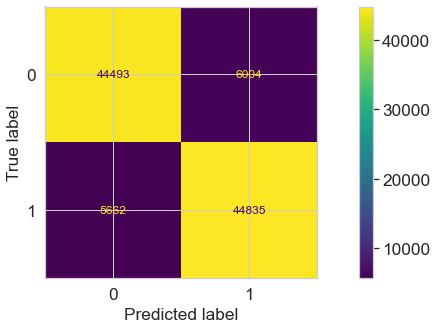

In [ ]:
# Confusion matrix for the Logistic Regression Model
cm = confusion_matrix(y_test, y_test_predLG, labels=lr.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lr.classes_, )
disp.plot()
plt.show()

##5. Final discussion and next steps



The objective of this project was to address the following questions:

* What variables can be used to establish credit risk at the moment of a loan request?
* What are the characteristics of the statistical model capable of predicting credit risk?

For the first question, this notebook has suggested that the five main variables that can be used to determine credit risk at the moment of a loan request are the following, in order of importance:

1.   last_fico_range_high: The upper boundary range the borrower’s last FICO pulled belongs to.
2.   installment: The monthly payment owed by the borrower if the loan originates
3.   dti: A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.

4.   term: The number of payments on the loan. Values are in months and can be either 36 or 60.

5.  emp_title: The job title supplied by the Borrower when applying for the loan.

For the second question, this notebook has suggested that the most appropriate model trained so far can be obtained via a binomial logistic regression approach and using the five features listed above (instead of the 70 features selected originally). This result can represent an important efficiency gain in terms of computational resources as the number of features has been greatly reduced with no loss of accuracy. In practical terms, this can improve the speed of the evaluation process by the time a customer apply for a new loan as only five attributes would be required to determine whether the loan request should be aproved or not.

Taken together, it is expected that the answers to these two questions contribute not only to the further development of techniques that assist organizations in identifying and managing risk in financial transactions, but also to be eventually replicated in other similar contexts, such as fraud in transactions commercial and fraudulent compensation claims.

It is also important to highlight the limitations of the current study. The fine-tuned Logistic Regression model that was trained using only the 5 most important features has shown comparable accuracy as the original model that was trained using all the 70 features, but was still underfitted.

Among the different approaches that can be attemped to potentially improve the quality of the model, the following are suggested, in order of importance:

1.  Adopt an oversamplig approach in order to maximize the value from the raw dataset.
2.  Develop an improved strategy to manage the high rates of missing values in certain attributes of the raw dataset.
3.  Remove outliers in an attempt to reduce the variability of the data and thus to increase the accuracy.
4. Further feature engineering, such as combining highly correlated features in an attempt to improve the quality of the model.
5. Perform fine-tunning to find the best hyperparaments and try ensemble methods.